# Группирование пиклистов и формирование матриц признаков MSI данных.
### Получение матрицы признаков имаджа функцией `Pgrouping_KD`.
##### **Кратко о работе функции**
Функция `Pgrouping_KD` группирует блуждающие значения пиков от одного сигнала и задаёт им одно значение `mz`. Функция группирует пики на основе ядерной оценки плотности вероятности расположения значений пиков, где определяются центры, вокруг которого значение `mz` блуждает. Эта функция требует качественный подбор ширины полосы пропускания. Поэтому помимо автоматических вариантов подбора - есть возможность задать вручную. Рассчёт оценки плотности вероятности совершается крайне быстрой функцией `FFTKDE` пакета `kdepy`, которая работает на основе фурье-преобразования. (https://github.com/tommyod/KDEpy).

Полученные сгруппированные пиклисты записываются в hdf5 файл, который выгружаются с помощью функции `feat2DF` (аналог `peakl2DF`, только работает с файлами оканчивающиеся на `_features.hdf5`). 

На выходе функции `Pgrouping_KD` словарь со стандартной структурой, в которые записаны пиклисты в формате DataFrame pandas.

Пример пути к датасету: HDF5File[Slide][sample][roi][dataset], 

- где `Slide` - это группа датасетов из одного hdf5 файла.

- `sample` - это группа данных, в которую выгружены данные из одного imzml файла (название sample создаётся следующим образом: <_название корневой папки imzml_>_<_название файла imzml_>, если <_название корневой папки imzml_> идентично <_название файла imzml_>, то sample записывается без дублированного названия и '\_' между)

- `roi` - это группа данных, отвечающая за область измерения. В одном файле imzml может быть записано несколько областей с одного эксперимента (к примеру файлы от Rapiflex). Но для остальных приборов в основном там только одна область: "00"

- `dataset` - название записанных данных:
    - `xy` - матрица координат (M,2), где каждая строка соответствует координатам спектра. 1-ая и 2-ая колонки - x и y координаты, соответственно.
    - `features` - пиклист после группировки с помощью KDE и фильтрации пиков, с заменённым столбцом "mz" на "Peak", где каждая строка - это характеристики одного пика из определённого спектра.
Индексация датасета согласно формату pandas DataFrame. Например:
* Выгрузить весь датасет:
 
    HDF5File[ Slide ][ sample ][ roi ][ dataset ]
* Выгрузить часть датасета:

    HDF5File[ Slide ][ sample ][ roi ][ dataset ].query('( Peak > 500 ) and ( Peak < 900 )')

    или эквивалентное (быстрее, но менее читаемое):
 
    HDF5File[ Slide ][ sample ][ roi ][ dataset ].loc[( HDF5File[ Slide ][ sample ][ roi ][ dataset ][ "Peak" ] > 500)&(HDF5File[ Slide ][ sample ][ roi ][ dataset ][ "Peak" ] < 900),:]

##### **Помимо группировки пиков, функция `Pgrouping_KD` делает:**
- Нормализаци. значений пиков внутри одного спектра.
- Фильтрация пиков по кол-ву их встречаемости в спектрах.
- Превращение пиклиста в матрицу признаков поворотом таблицы относительно индекса спектра, пика и на выбор по какому значению (интенсивность, площадь и тд), что делает готовым таблицу к работе в машинном обучении (В `hdf5` сохраняется всё равно пиклист).

##### **Параметры функции `Pgrouping_KD`:**
- `ftable`: Источник данных. Может быть таблицей/датафреймом, а может быть ссылкой на папку с пиклистами в подпапках, которые надо выгрузить или прямой ссылкой на файл, оканчивающийся на `_specdata.hdf5`
- `columns`: Лист номеров столбцов, которые войдут в датафрейм фич, где 0 и 1 - экстрагируются всегда (`"spectra_ind"` и `"mz"` или `"Peak"`). 
    - `None` (Default) - экстракция всех столбцов
    - значения: 2 - `"Intensity"`, 3 -`"Area"`, 4 - `"SNR"`, 5 - `"PextL"`, 6 - `"PextR"`, 7 - `"FWHML"`, 8 - `"FWHMR"`, 9-`"Noise"`, 10-`"Mean noise"`
- `KD_bandwidth`: - выбор полосы пропускания, либо алгоритм её определения:
    - `"med_FWHM"` - полоса пропускания равна медианному значению дисперсии пиков, которая определяется из медианы ширины на полувысоте. 
    - `"mz_discret"` - полоса пропускания равна медиане расстояний между точками шкалы mz, где лучше всего, если есть доступ к файлу hdf5 и imzml. 
    - `"ISJ"`,`"silverman"`,`"scott"` - базовые для функции FFTKDE (из пакета KDEpy)
    - `float` значение - прямое численное назначение размера полосы пропускания
- `bwc`: коэффициент домножения полосы пропускания
- `KD_kernel`: KDE ядро (see also: https://kdepy.readthedocs.io/en/latest/kernels.html#available-kernels)
- `CountF`: Параметр исключение из датасета редких/шумовых пиков, чьё кол-во меньше данного значения
- `params2mspeaks_KD`: остальные параметры для функции mspeaks_KD (`oversegmentation` и `peaklocation`)
- `tol`: tolerance in ppm of m/z (used for batching dots by window)
- `norm`: Default (None, None). First is type of normalization on spectrum: "l1", "l2", "max". Second is which column normalize (str or list)
- `draw_borders`: graphics borders extension ± m/z
- `dupl_drop`: `True` - удаление дубликатов в итоговой таблице.
- `min_res`: минимальное разрешение прибора в ppm. Контролирует минимальное значение полосы пропускания для метода её определения `"mz_discret"` и максимальное кол-во точек при построении оценки плотности вероятности
- `pivoting4val`: list of columns or None (default) - resulted table is pivoted by index: spectra_ind, columns: Peak with fill_value = 0, and values: list of columns from pivoting4val. If None - do nothing about pivoting.
- `cpu_free`: Number of CPU cores don't used in multiproccessing
- `path2save`: path to save in hdf5 file, if parameter `ftable` is pandas DataFrame. 
- `sample`: works with path2save and ftable is pandas DataFrame. It's a name for sample group in writing hdf5 file. Default: "unknwn"
- `roi`: works with path2save and ftable is pandas DataFrame. It's a name for roi group in writing hdf5 file. Default: "00"
- `coords4table`: works with path2save and ftable is pandas DataFrame. It's coordinates for saving in hdf5 file. Default: None
##### **Пример работы функции:**

The Rapiflex raw spectra data is on progress.
Slide's Rapiflex spectra coordinates and metadata extraction for preparation parallel proccessing
Slide's Rapiflex spectra coordinates writing
Slide's Rapiflex spectra parallel proccessing


Batches progress:   0%|          | 0/38 [00:00<?, ?it/s]

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(


Rapiflex, roi8_e040 and roi 00. x and y coordinates were extracted
Previous processed features data is deleted


c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of roi8_e040 00, 948 duplicates were identified, of which 51 were unique peaks in 914 of mass spectra (4.32% of the total spectra).
  warnings.warn(textw)


Grouping results of roi8_e040 00:
Number of unique peaks before grouping: 6540
Number of unique peaks after grouping: 1585
Number of excluded peaks by count filter(100): 1010 (63.72%)
Resulted feature peaks is 575
Processed features of sample roi8_e040 roi 00 is saved in hdf5 file
Keys for Slide: dict_keys(['Rapiflex'])
Keys for Sample: dict_keys(['roi8_e040'])
Keys for roi: dict_keys(['00'])
Keys for datasets: dict_keys(['xy', 'features'])


,spectra_ind,Peak,Intensity,Area,FWHML,FWHMR
0,0,100.436218,0.000845,0.067246,100.363976,100.492348
1,0,112.111398,0.005152,0.310645,112.053123,112.156563
2,0,114.067126,0.011089,0.700595,114.006798,114.115852
3,0,116.038294,0.000817,0.076659,115.910149,116.087448
4,0,117.026451,0.001215,0.088919,116.954208,117.065781
...,...,...,...,...,...,...
3909652,21157,481.185524,0.001701,0.152531,481.133179,481.268921
3909653,21157,497.263665,0.000732,0.090629,497.162933,497.416901
3909654,21157,665.345595,0.001306,0.128960,665.289185,665.444275
3909655,21157,888.332007,0.000919,0.103200,888.250000,888.417908


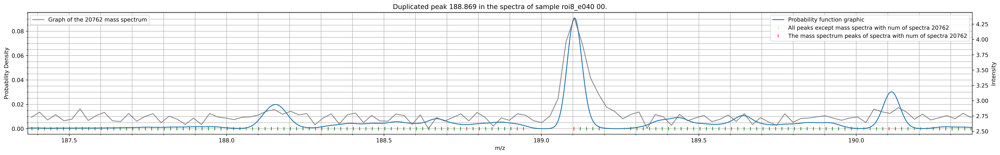

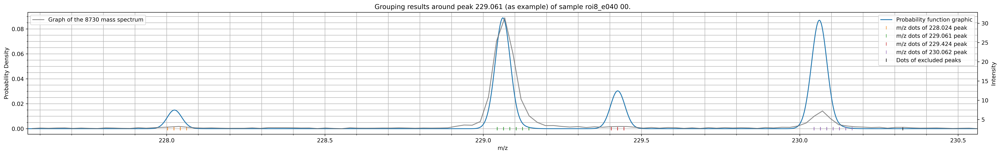

In [1]:
from pelmesha.pfeats import Pgrouping_KD
from pelmesha.pspectra import Raw2peaklist

path = r"D:\Testing\Our_data\Rapiflex\roi8_e040" # Обработаем только один файл imzml для экономии времени

Raw2peaklist(path, draw=False, oversegmentationfilter=0.15,SNR_threshold=4,resample_to_dots=50000,smooth_algo='GA',smooth_window=0.2,Ram_GB = 10)
path = r"D:\Testing\Our_data\Rapiflex"

fdata = Pgrouping_KD(path,columns=[2,3], CountF=100, norm=('max','Intensity'))
#Чтобы узнать ключи каждой группы данных, необходимо ввести .keys() в конце
print(f"Keys for Slide: {fdata.keys()}")
print(f"Keys for Sample: {fdata['Rapiflex'].keys()}") 
print(f"Keys for roi: {fdata['Rapiflex']['roi8_e040'].keys()}") 
print(f"Keys for datasets: {fdata['Rapiflex']['roi8_e040']['00'].keys()}") 
# Отобразим датасет матрицы признаков
display(fdata['Rapiflex']['roi8_e040']['00']['features'])

##### **Пример с поворотом таблицы относительно одного значения `Area`.**

Rapiflex, roi8_e040 and roi 00. x and y coordinates were extracted
Previous processed features data is deleted


c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of roi8_e040 00, 948 duplicates were identified, of which 51 were unique peaks in 914 of mass spectra (4.32% of the total spectra).
  warnings.warn(textw)


Grouping results of roi8_e040 00:
Number of unique peaks before grouping: 6540
Number of unique peaks after grouping: 1585
Number of excluded peaks by count filter(100): 1010 (63.72%)
Resulted feature peaks is 575
Processed features of sample roi8_e040 roi 00 is saved in hdf5 file


Peak,100.436218,104.368261,110.086191,112.111398,114.067126,116.038294,117.026451,118.012035,120.876146,122.821581,...,930.338980,931.334857,932.346174,933.347198,934.350795,935.362112,936.355416,942.312666,944.397060,1077.049438
spectra_ind,,,,,,,,,,,,,,,,,,,,,
0,0.000856,0.000000,0.0,0.003953,0.008914,0.000975,0.001131,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000917,0.000674,0.0,0.003871,0.009731,0.000892,0.000993,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000947,0.000000,0.0,0.003516,0.010190,0.001334,0.000798,0.001039,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000859,0.000797,0.0,0.003707,0.008848,0.001270,0.000969,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000821,0.000827,0.0,0.003362,0.008913,0.001288,0.001017,0.000788,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21153,0.000000,0.000000,0.0,0.003481,0.008252,0.001019,0.001006,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21154,0.000000,0.000607,0.0,0.003647,0.007795,0.001038,0.000982,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21155,0.000000,0.000816,0.0,0.003372,0.007971,0.000831,0.000817,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


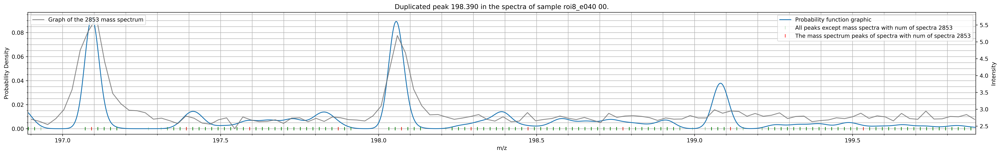

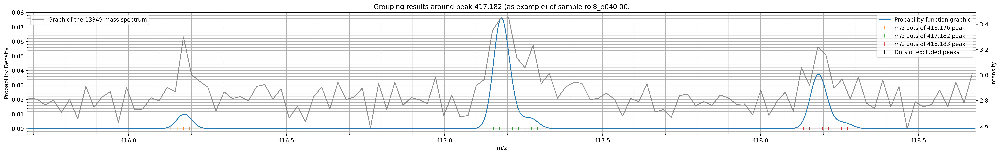

In [2]:
# Отобразим теперь повёрнутую таблицу с признаками площади пиков
fdata_pivo = Pgrouping_KD(path,columns=[2,3], CountF=100, norm=('max','Area'),pivoting4val='Area')
display(fdata_pivo['Rapiflex']['roi8_e040']['00']['features'])

##### **Пример с поворотом таблицы относительно нескольких значений.**

Rapiflex, roi8_e040 and roi 00. x and y coordinates were extracted
Previous processed features data is deleted


c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of roi8_e040 00, 948 duplicates were identified, of which 51 were unique peaks in 914 of mass spectra (4.32% of the total spectra).
  warnings.warn(textw)


Grouping results of roi8_e040 00:
Number of unique peaks before grouping: 6540
Number of unique peaks after grouping: 1585
Number of excluded peaks by count filter(100): 1010 (63.72%)
Resulted feature peaks is 575
Processed features of sample roi8_e040 roi 00 is saved in hdf5 file


Area                                                  \
Peak        100.436218  104.368261  110.086191  112.111398  114.067126    
spectra_ind                                                               
0              0.000856    0.000000         0.0    0.003953    0.008914   
1              0.000917    0.000674         0.0    0.003871    0.009731   
2              0.000947    0.000000         0.0    0.003516    0.010190   
3              0.000859    0.000797         0.0    0.003707    0.008848   
4              0.000821    0.000827         0.0    0.003362    0.008913   
...                 ...         ...         ...         ...         ...   
21153          0.000000    0.000000         0.0    0.003481    0.008252   
21154          0.000000    0.000607         0.0    0.003647    0.007795   
21155          0.000000    0.000816         0.0    0.003372    0.007971   
21156          0.000000    0.000807         0.0    0.004106    0.009449   
21157          0.000000    0.000906         0.0    0.003722    0.009226   

                                                                         ...  \
Peak        116.038294  117.026451  118.012035  120.876146  122.821581   ...   
spectra_ind                                                              ...   
0              0.000975    0.001131    0.000000    0.000000         0.0  ...   
1              0.000892    0.000993    0.000000    0.000000         0.0  ...   
2              0.001334    0.000798    0.001039    0.000000         0.0  ...   
3              0.001270    0.000969    0.000000    0.000000         0.0  ...   
4              0.001288    0.001017    0.000788    0.000000         0.0  ...   
...                 ...         ...         ...         ...         ...  ...   
21153          0.001019    0.001006    0.000000    0.000000         0.0  ...   
21154          0.001038    0.000982    0.000000    0.000000         0.0  ...   
21155          0.000831    0.000817    0.000000    0.000000         0.0  ...   
21156          0.001074    0.001125    0.000744    0.000000         0.0  ...   
21157          0.001033    0.000925    0.000000    0.000857         0.0  ...   

              Intensity                                                  \
Peak        930.338980  931.334857  932.346174  933.347198  934.350795    
spectra_ind                                                               
0                   0.0         0.0         0.0         0.0         0.0   
1                   0.0         0.0         0.0         0.0         0.0   
2                   0.0         0.0         0.0         0.0         0.0   
3                   0.0         0.0         0.0         0.0         0.0   
4                   0.0         0.0         0.0         0.0         0.0   
...                 ...         ...         ...         ...         ...   
21153               0.0         0.0         0.0         0.0         0.0   
21154               0.0         0.0         0.0         0.0         0.0   
21155               0.0         0.0         0.0         0.0         0.0   
21156               0.0         0.0         0.0         0.0         0.0   
21157               0.0         0.0         0.0         0.0         0.0   

                                                                         
Peak        935.362112  936.355416  942.312666  944.397060  1077.049438  
spectra_ind                                                              
0                   0.0         0.0         0.0         0.0         0.0  
1                   0.0         0.0         0.0         0.0         0.0  
2                   0.0         0.0         0.0         0.0         0.0  
3                   0.0         0.0         0.0         0.0         0.0  
4                   0.0         0.0         0.0         0.0         0.0  
...                 ...         ...         ...         ...         ...  
21153               0.0         0.0         0.0         0.0         0.0  
21154               0.0         0.0         0.0         

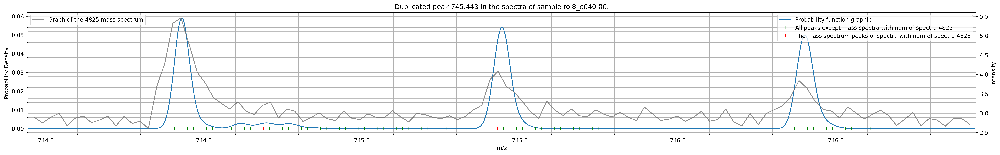

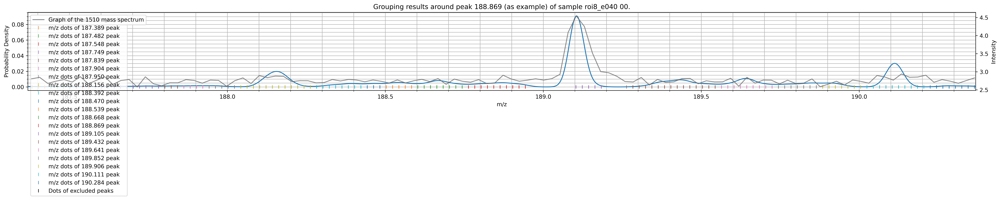

In [3]:
# Отобразим теперь повёрнутую таблицу с признаками площади и интенсивностями пиков
fdata_pivo = Pgrouping_KD(path,columns=[2,3], CountF=100, norm=('max',['Area',"Intensity"]),pivoting4val=['Area',"Intensity"])
display(fdata_pivo['Rapiflex']['roi8_e040']['00']['features'])

##### **Пример получения таблицы признаков с предварительной свободной обработкой таблицы конечным юзером:**
В функцию `Pgrouping_KD` можно передать сразу саму таблицу, предварительно обработав согласно решению/изучению нестандартных задач использующего.

В качестве примера проведём обработку данных **с более подходящей фильтрацией шума для масс-анализатора `Orbitrap`** способом указанным в [данной работе](https://pubs.acs.org/doi/10.1021/ac403278t). Суть применения, так как SNR методы фильтрации для данных полученных на масс-анализаторе `Orbitrap` не работают и SNR равный 3 - не будет отображать истинну.

Получим пиклисты имаджа сделанный масс-спектрометром с анализатором Orbitrap. Для ускорения рассчётов, ввиду показательности работы, не будем применять выравнивание, чтобы также избежать обязательного применения ресемпла (для данных с высоким разрешением необходимо делать ресемпл с большим кол-вом точек, что вместе с выравниванием - является наиболее ресурсотребовательным в обработке). Так как мы будем применять другой фильтр шума, то для полноты работы, поставим фильтр шума `SNR_threshold` = 0, а все остальные фильтры по дефолту на нуле.

The Orbitrap raw spectra data is on progress.
Slide's Orbitrap spectra coordinates and metadata extraction for preparation parallel proccessing
The test1_poslog.txt file is not in directory D:\Testing\Our_data\Orbitrap\1, the coordinate data is taken from the imzML file
Slide's Orbitrap spectra coordinates writing
Slide's Orbitrap spectra parallel proccessing


Batches progress:   0%|          | 0/37 [00:00<?, ?it/s]

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession MS:1000563 found with incorrect name "Thermo RAW file". Updating name to "Thermo RAW format".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession MS:1000590 found with incorrect name "contact organization". Updating name to "contact affiliation".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:84: UserWarning: Accession MS:1000128 ("profile spectrum") found with mismatched name "positive scan". This is a known bug with some imzML conversion software - using accession MS:1000130 ("positive scan") instead.
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000042 found with incorrect name "max count of pixel x". Updating name t

Spectrum number: 43471


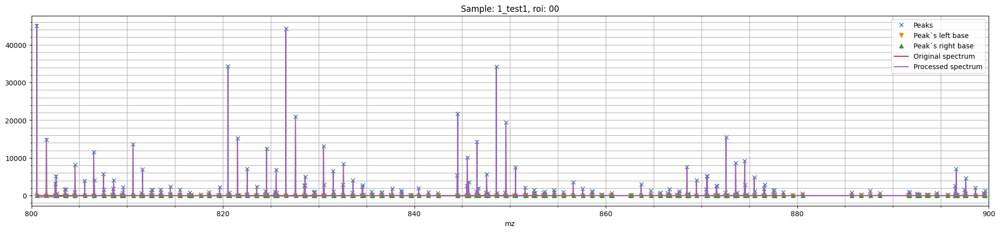

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession MS:1000563 found with incorrect name "Thermo RAW file". Updating name to "Thermo RAW format".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession MS:1000590 found with incorrect name "contact organization". Updating name to "contact affiliation".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:84: UserWarning: Accession MS:1000128 ("profile spectrum") found with mismatched name "positive scan". This is a known bug with some imzML conversion software - using accession MS:1000130 ("positive scan") instead.
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000042 found with incorrect name "max count of pixel x". Updating name t

In [4]:
import matplotlib.pyplot as plt
from pelmesha.loaders import peakl2DF
from KDEpy import FFTKDE 
from scipy.signal import argrelextrema
from pelmesha.pspectra import Raw2peaklist
from pelmesha.pfeats import Pgrouping_KD
import numpy as np

path = r"D:\Testing\Our_data\Orbitrap\1"
Raw2peaklist(path, mz_diap4draw=(800,900),SNR_threshold=0,Ram_GB = 10)

Выгрузим полученный пиклист и найдём оптимальный шумовой порог интенсивностей, описанный в статье

Orbitrap, 1_test1 and roi 00. x and y coordinates were extracted


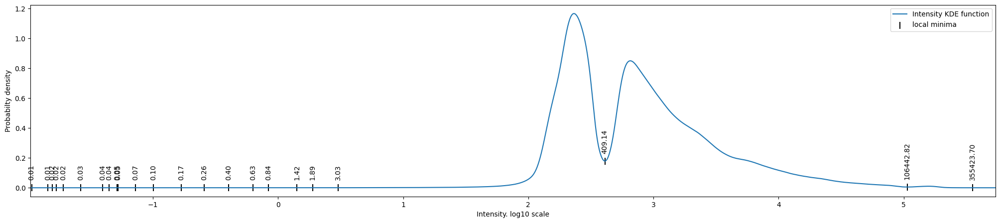

In [5]:
path = r"D:\Testing\Our_data\Orbitrap"
peaklist = peakl2DF(path,extr_columns=None)
# Так как пиклист единственный - упростим использование
pl = peaklist['Orbitrap']['1_test1']['00']['peaklists'].copy()
p=np.log10(pl['Intensity']).copy() #преобразуем интенсивности в десятичные логарифмы

#Построим функцию плотности
ints = np.array(p.loc[p>np.log10(0.01)]) #Для ускорения рассчётов - исключим пики с интенсивностями явно шумовыми
X_plot = np.arange(ints.min()-0.001,ints.max()+0.001,0.00001) #Построим равномерную сетку для построении функции плотности вероятности десятичного логарифма
Y_kde = FFTKDE(bw='scott').fit(ints)(X_plot) #Определяем плотность вероятности десятичного логарифма интенсивностей с использованием функции построения KDE с применением фурье-преобразования (пакет KDEpy)
peaks = argrelextrema(Y_kde,np.less) # Находим индексы всех локальных минимумов, для отрисовки соответствующие им значения интенсивностей на графиках
intensity = 10**X_plot[peaks] # Преобразуем в интенсивности обратно для отрисовки
plt.figure(figsize=(25,5))
plt.plot(X_plot,Y_kde)
plt.scatter(X_plot[peaks],Y_kde[peaks],100,'k','|')
plt.xlabel("Intensity. log10 scale")
plt.ylabel("Probabilty density")
plt.legend(['Intensity KDE function','local minima'])
plt.xlim((ints.min(),ints.max()))
# Добавим подписи к минимумам
for x,y,s in zip(list(X_plot[peaks]),(Y_kde[peaks]),[f'{x:.2f}' for x in intensity]):
    plt.text(x,y+0.05,s,rotation=90,verticalalignment='bottom',horizontalalignment='center')

Из графика выше, всё что находится ниже интенсивности `409.14` с высокой вероятностью является шумом и это значение считаем пороговым. Для дальнейшей группировки пиков - исключим все пики с интенсивностью ниже `409.14` и сразу же внесём в функцию `Pgrouping_KD` в виде таблицы, выставим параметры фильтрации, чтобы исключались пики, которые во всём имадже встречаются менее 100 раз.

Также к таблице можно добавлять новые характеристики пиков и нормализовать их в функции `Pgrouping_KD`. Для примера данной возможности, предварительно добавим к таблице параметр `FWHM` и нормализуем его в функции по максимальной величине (Без какого-либо смысла, просто показать).

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:479: UserWarning: Warning. The value of 10.0 ppm is used as the minimum distance between points to build the density distribution. If you want to build a more accurate probability distribution, change the "min_res" parameter. (Example: accuracy of Orbitrap ~ 10 ppm)
  warnings.warn(textw)
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of unknwn 00, 2431 duplicates were identified, of which 202 were unique peaks in 2327 of mass spectra (3.82% of the total spectra).
  warnings.warn(textw)


Grouping results of unknwn 00:
Number of unique peaks before grouping: 482479
Number of unique peaks after grouping: 8754
Number of excluded peaks by count filter(100): 5697 (65.08%)
Resulted feature peaks is 3057


,spectra_ind,Peak,Intensity,Area,SNR,PextL,PextR,FWHML,FWHMR,Noise,Mean noise,FWHM
0,0,350.990528,36634.628906,229.223068,600.415100,350.981232,350.999969,350.988007,350.993896,61.015503,-28.461889,0.161913
1,0,351.993919,5021.345703,31.758595,82.296227,351.987671,352.000214,351.991272,351.997101,61.015503,-28.461889,0.160235
2,0,352.988011,2384.433838,16.554083,39.079147,352.981659,352.995819,352.985168,352.991058,61.015503,-28.461889,0.161913
3,0,357.038765,830.071045,6.047819,13.604265,357.030945,357.043732,357.035889,357.041351,61.015503,-28.461889,0.150168
4,0,358.048354,4284.580078,31.119408,70.221169,358.039246,358.058716,358.045105,358.051239,61.015503,-28.461889,0.168624
...,...,...,...,...,...,...,...,...,...,...,...,...
22897781,65755,1139.611309,934.625610,33.555325,9.632448,1139.574097,1139.637939,1139.594116,1139.628662,97.028877,-56.240551,0.946488
22897782,65755,1144.545356,580.256104,17.114134,5.980241,1144.516846,1144.571899,1144.535400,1144.561523,97.028877,-56.240551,0.715719
22897783,65755,1154.583910,1315.489380,45.810612,13.557710,1154.541504,1154.606567,1154.562012,1154.595459,97.028877,-56.240551,0.916388
22897784,65755,1158.922121,688.445435,24.100246,7.095263,1158.884033,1158.940186,1158.900513,1158.934082,97.028877,-56.240551,0.919732


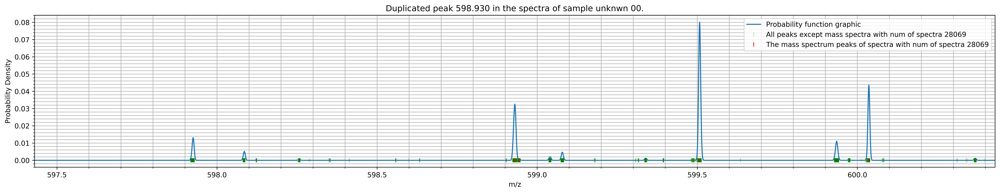

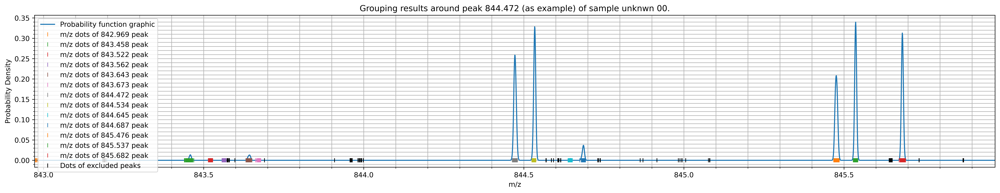

In [6]:
pl["FWHM"]= pl.loc[:,"FWHMR"] - pl.loc[:,"FWHML"]
gr_pl = Pgrouping_KD(pl.query("Intensity>409.14"),CountF=100, norm=("max","FWHM"))
display(gr_pl)

При внесении в качестве аргумента в `Pgrouping_KD` таблицы её также можно сохранить в hdf5 формат, но для этого требуется внести в параметры: - `path2save`,`sample`,`roi` и `coords4table`

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:479: UserWarning: Warning. The value of 10.0 ppm is used as the minimum distance between points to build the density distribution. If you want to build a more accurate probability distribution, change the "min_res" parameter. (Example: accuracy of Orbitrap ~ 10 ppm)
  warnings.warn(textw)
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of 1_test1 00, 2431 duplicates were identified, of which 202 were unique peaks in 2327 of mass spectra (3.82% of the total spectra).
  warnings.warn(textw)


Grouping results of 1_test1 00:
Number of unique peaks before grouping: 482479
Number of unique peaks after grouping: 8754
Number of excluded peaks by count filter(100): 5697 (65.08%)
Resulted feature peaks is 3057
Processed features of sample 1_test1 roi 00 is saved in hdf5 file


,spectra_ind,Peak,Intensity,Area,SNR,PextL,PextR,FWHML,FWHMR,Noise,Mean noise,FWHM
0,0,350.990528,36634.628906,229.223068,600.415100,350.981232,350.999969,350.988007,350.993896,61.015503,-28.461889,0.005890
1,0,351.993919,5021.345703,31.758595,82.296227,351.987671,352.000214,351.991272,351.997101,61.015503,-28.461889,0.005829
2,0,352.988011,2384.433838,16.554083,39.079147,352.981659,352.995819,352.985168,352.991058,61.015503,-28.461889,0.005890
3,0,357.038765,830.071045,6.047819,13.604265,357.030945,357.043732,357.035889,357.041351,61.015503,-28.461889,0.005463
4,0,358.048354,4284.580078,31.119408,70.221169,358.039246,358.058716,358.045105,358.051239,61.015503,-28.461889,0.006134
...,...,...,...,...,...,...,...,...,...,...,...,...
22897781,65755,1139.611309,934.625610,33.555325,9.632448,1139.574097,1139.637939,1139.594116,1139.628662,97.028877,-56.240551,0.034546
22897782,65755,1144.545356,580.256104,17.114134,5.980241,1144.516846,1144.571899,1144.535400,1144.561523,97.028877,-56.240551,0.026123
22897783,65755,1154.583910,1315.489380,45.810612,13.557710,1154.541504,1154.606567,1154.562012,1154.595459,97.028877,-56.240551,0.033447
22897784,65755,1158.922121,688.445435,24.100246,7.095263,1158.884033,1158.940186,1158.900513,1158.934082,97.028877,-56.240551,0.033569


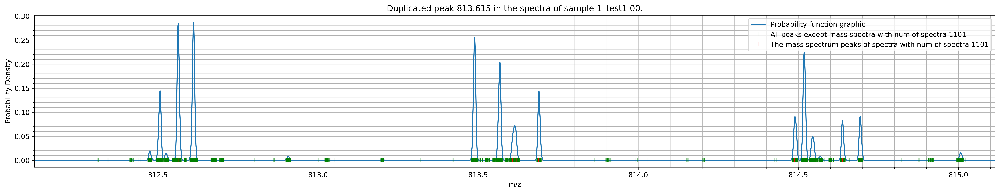

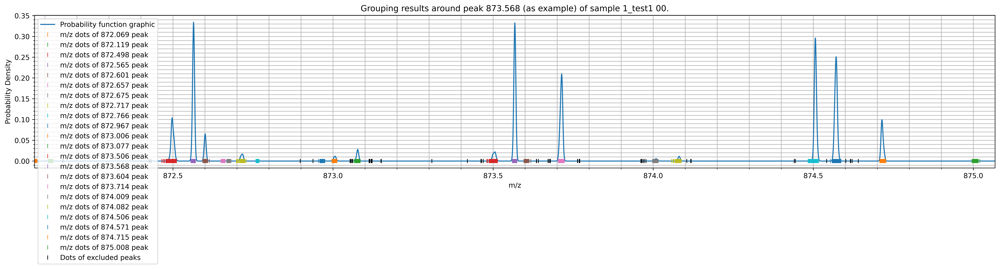

In [7]:
gr_pl = Pgrouping_KD(pl.query("Intensity>409.14"),CountF=100,path2save=r"D:\Testing\Our_data\Orbitrap",sample='1_test1',roi="00",coords4table=peaklist['Orbitrap']['1_test1']['00']['xy'])
display(gr_pl)

Для выгрузки записанных таблиц признаков применяется функция `feat2DF` модуля `loaders`.

#####  Параметры функции:
- `batch_path` - путь к папке/файлу `hdf5`. Возможно задать сразу несколько путей списком: [path_1, path_2].
    - Если нужно работать только с одним файлом в указанном пути, то лучше указать прямой путь к нему (example: *r"D:\Testing\Our_data\Rapiflex\Rapiflex_features.hdf5"*).
    - Если необходимо выгрузить сразу несколько файлов, указав один путь, то можно указать путь к общей папке (example: *r"D:\Testing\Our_data\"*).
- `extr_columns` - какие именно столбцы выгружать. Отсутствующие столбцы не выгружаются.
    - Если `None` (Default), то выгружает все столбцы
    - если лист целых чисел, то выгружает **только** следующие столбцы, соответствующие цифрам: 
        - 2 - `"Intensity"`, 
        - 3 -`"Area"`, 
        - 4 - `"SNR"`, 
        - 5 - `"PextL"`, 
        - 6 - `"PextR"`, -
        - 7 - `"FWHML"`, 
        - 8 - `"FWHMR"`, 
        - 9 -`"Noise"`, 
        - 10 -`"Mean noise"`
     Если данные содержат столбец, не указанный выше, то его можно выгрузить только через `None` вместе со всеми столбцами
- `extract_coords` - Если `True`(default), то выгружает координаты масс-спектров имаджа.
- `pivoting4val`: list of columns or None (default) - resulted table is pivoted by index: `spectra_ind`, columns: `Peak` with fill_value = 0, and values: list of columns from pivoting4val. If `None` - do nothing about pivoting.

In [8]:
from pelmesha.loaders import feat2DF

# Выгрузим пиклист с отсутствующим столбцом 4 - SNR
columns=[3,4,7,8]
path = r"D:\Testing\Our_data\Rapiflex"
ftable = feat2DF(path,extr_columns=columns)

display("Feature table",ftable['Rapiflex']['roi8_e040']['00']['features'])
# Выгрузим координаты спектров
display("Coordinates", ftable['Rapiflex']['roi8_e040']['00']['xy'])

# Выгрузим пиклист 
path = r"D:\Testing\Our_data\Orbitrap\1_test1_00_features.hdf5"
ftable = feat2DF(path,extr_columns=columns)

display("Feature table",ftable['Orbitrap']['1_test1']['00']['features'])
# Выгрузим координаты спектров
display("Coordinates", ftable['Orbitrap']['1_test1']['00']['xy'])

SNR doesn't founded in hdf5 column headers
Rapiflex, roi8_e040 and roi 00. x and y coordinates were extracted


'Feature table'

,spectra_ind,Peak,Area,FWHML,FWHMR
0,0,100.436218,0.000856,100.363976,100.492348
1,0,112.111398,0.003953,112.053123,112.156563
2,0,114.067126,0.008914,114.006798,114.115852
3,0,116.038294,0.000975,115.910149,116.087448
4,0,117.026451,0.001131,116.954208,117.065781
...,...,...,...,...,...
3909652,21157,481.185524,0.001942,481.133179,481.268921
3909653,21157,497.263665,0.001154,497.162933,497.416901
3909654,21157,665.345595,0.001642,665.289185,665.444275
3909655,21157,888.332007,0.001314,888.250000,888.417908


'Coordinates'

,x,y
spectra_ind,,
0,79580.0,-21525.0
1,79600.0,-21525.0
2,79620.0,-21525.0
3,79640.0,-21525.0
4,79660.0,-21525.0
...,...,...
21153,80680.0,-24325.0
21154,80700.0,-24325.0
21155,80720.0,-24325.0


Orbitrap, 1_test1 and roi 00. x and y coordinates were extracted


'Feature table'

,spectra_ind,Peak,Area,SNR,FWHML,FWHMR
0,0,350.990528,229.223068,600.415100,350.988007,350.993896
1,0,351.993919,31.758595,82.296227,351.991272,351.997101
2,0,352.988011,16.554083,39.079147,352.985168,352.991058
3,0,357.038765,6.047819,13.604265,357.035889,357.041351
4,0,358.048354,31.119408,70.221169,358.045105,358.051239
...,...,...,...,...,...,...
22897781,65755,1139.611309,33.555325,9.632448,1139.594116,1139.628662
22897782,65755,1144.545356,17.114134,5.980241,1144.535400,1144.561523
22897783,65755,1154.583910,45.810612,13.557710,1154.562012,1154.595459
22897784,65755,1158.922121,24.100246,7.095263,1158.900513,1158.934082


'Coordinates'

,x,y
spectra_ind,,
0,2640.0,80.0
1,2680.0,80.0
2,2720.0,80.0
3,2760.0,80.0
4,2800.0,80.0
...,...,...
65751,5760.0,13800.0
65752,5800.0,13800.0
65753,5840.0,13800.0


### Получение общей матрицы признаков нескольких имаджей.
Сравнение нескольких имаджей затруднено в ввиду особенностей каждого масс-спектрометра и наличия систематических и случайных ошибок измерения, а также ввиду большого кол-ва аналитов, чьи массы находятся очень близко/на пределе разрешения прибора. Так значительные отклонения в сигналах по `mz` могут происходить и даже в течение одного запуска получения имаджа. Выравнивание позволяет исключить систематическую ошибку и лишь частично случайную, которая может сильно затруднить определение признака (сигнала) у близко стоящих пиков. Поэтому необходимо провести ещё одно выравнивание на основе статистики, которой в имадже достаточна из-за большого кол-ва масс-спектров, позволяющей повысить точность определения m/z сигнала.

Таким образом для получения общей матрицы признаков для нескольких имаджей необходимо:
1) Составить список общих референсных пиков для выравнивания спектров для всех рассматриваемых имаджей. 

    Этот список должен покрывать как можно больший диапазон `mz`. Список референсных пиков можно задать вручную, либо выбрать "эталонный" пиклист из хорошо откалиброванного/выравненного имаджа и вынести из него с помощью функции `Getrefpeaks` список пиков и их частоты встречаемости в имадже, таким образом выравнивание остальных имаджей будет происходить относительно "эталонного" пиклиста.
2) Обработать и выравнить имаджи по списку референсных пиков и получить пиклисты. 
3) С помощью функции `Roi_Pgrouping_KD` объединить пиклисты и сгруппировать пики имаджей, где на выходе и будет наша матрица-признаков после поворота таблицы относительно тех величин, которые нас интересуют.

#### Параметры функции `Getrefpeaks`:
- `ref_rois_paths`: Пути к файлам hdf5 с пиклистами, из которых будем получать референсные пики. Example:
    - dict = {path_1: [ [sample_1, [roi_list_1] ], [sample_2, [roi_list_2] ], ....],  path_2: [ [sample_3, [roi_list_3] ], [sample_4, [roi_list_4] ],....]}, 
    
        где "path_n" - path to hdf5 file directory, "sample_n" - какой именно sample (string), если None - берёт всё, "roi_list_n" - список каких roi использовать, если отсутствует, то берёт всё (example: dict value: list[sample_n])
    - list[ path_1, path_2], "path_n" - path to hdf5 file directory, используются все sample и roi в них.
- `step`: шаг одного промежутка по mz диапазону, в котором выбираются наиболее частовстречаемые пики
- `num_peaks_per_step`: количество пиков, выбираемые из каждого промежутка
- `min_occurence`: минимальная частота встречаемости пиков для отбора
- `return_weight`: Возвращается ли вес пиков
- `Pgrouping_KD_kwargs`: Параметры функции `Pgrouping_KD`


#### Параметры функции `Roi_Pgrouping_KD`: 
- `paths`: Пути к файлам hdf5 с пиклистами, для получение общих признаков. Example:
    - dict = {path_1: [ [sample_1, [roi_list_1] ], [sample_2, [roi_list_2] ], ....],  path_2: [ [sample_3, [roi_list_3] ], [sample_4, [roi_list_4] ],....]}, 
    
        где "path_n" - path to hdf5 file directory, "sample_n" - какой именно sample (string), если None - берёт всё, "roi_list_n" - список каких roi использовать, если отсутствует, то берёт всё (example: dict value: list[sample_n])
    - list[ path_1, path_2], "path_n" - path to hdf5 file directory, используются все sample и roi в них.
- `extr_columns`: список номеров столбцов для экстракции из `hdf5`, где 0 и 1 - экстрагируются всегда (`"spectra_ind"` и `"mz"` или `"Peak"`). Default: `None` - экстракция всех столбцов
    2 - `"Intensity"`, 3 -`"Area"`, 4 - `"SNR"`, 5 - `"PextL"`, 6 - `"PextR"`, 7 - `"FWHML"`, 8 - `"FWHMR"`, 9-`"Noise"`, 10-`"Mean noise"`
- `Pgrouping_KD_kwargs`: параметры функции `Pgrouping_KD`
- `path2save`: путь куда будут сохранены данные в файл с названием "Images_{количество_имаджей}_grouped_MSIdata.hdf5". Если `None`, то данные не будут сохранены в файл.

#### Example
##### Получение референсных пиков с помощью `Getrefpeaks`
Обработаем референсный имадж

The Rapiflex raw spectra data is on progress.
Slide's Rapiflex spectra coordinates and metadata extraction for preparation parallel proccessing
Slide's Rapiflex spectra coordinates writing
Slide's Rapiflex spectra parallel proccessing


Batches progress:   0%|          | 0/38 [00:00<?, ?it/s]

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(


Rapiflex, roi1_e046 and roi 00. x and y coordinates were extracted
Previous processed features data is deleted


c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of roi1_e046 00, 176 duplicates were identified, of which 38 were unique peaks in 176 of mass spectra (0.67% of the total spectra).
  warnings.warn(textw)


Grouping results of roi1_e046 00:
Number of unique peaks before grouping: 9060
Number of unique peaks after grouping: 3071
Number of excluded peaks by count filter(100): 2632 (85.70%)
Resulted feature peaks is 439
Processed features of sample roi1_e046 roi 00 is saved in hdf5 file


{'Rapiflex': {'roi1_e046': {'00': {'xy':                    x        y
    spectra_ind                  
    0            27380.0 -52105.0
    1            27400.0 -52105.0
    2            27420.0 -52105.0
    3            27440.0 -52105.0
    4            27460.0 -52105.0
    ...              ...      ...
    26365        26840.0 -55905.0
    26366        26860.0 -55905.0
    26367        26880.0 -55905.0
    26368        26900.0 -55905.0
    26369        26920.0 -55905.0
    
    [26370 rows x 2 columns],
    'features':          spectra_ind        Peak  Intensity      Area         SNR       PextL  \
    0                  0  100.451658   0.502878  0.059779   10.522492  100.293198   
    1                  0  112.126838   2.329159  0.255621   48.736557  111.985085   
    2                  0  114.082566  12.336557  1.365335  258.136627  113.826958   
    3                  0  116.048587   0.646906  0.093988   13.536203  115.869034   
    4                  0  127.754647   0.599205  

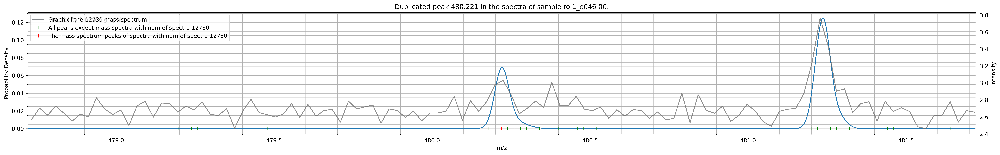

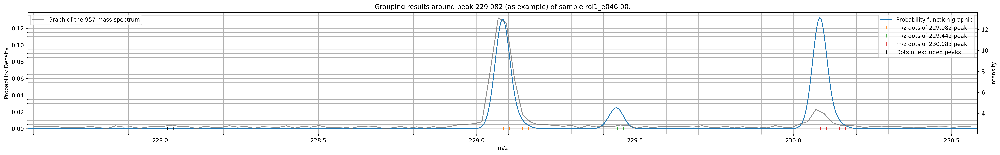

In [9]:
from pelmesha.pspectra import Raw2peaklist
from pelmesha.pfeats import Pgrouping_KD
path = r"D:\Testing\Our_data\Rapiflex\roi1_e046" # Обработаем только один файл imzml для экономии времени

Raw2peaklist(path, draw=False, oversegmentationfilter=0.15,SNR_threshold=4,resample_to_dots=50000,smooth_algo='GA',smooth_window=0.2,Ram_GB = 10)
path = r"D:\Testing\Our_data\Rapiflex"
Pgrouping_KD(path,CountF=100)


Получим референсные пики из признаков.

In [10]:
from pelmesha.pfeats import Getrefpeaks
import pandas as pd
ref_roi = {r"D:\Testing\Our_data\Rapiflex":[('roi1_e046')]} # так как в файле только один имадж, то в данной ситуации эквивалентен просто путь r"D:\Testing\Our_data\Rapiflex\Rapiflex_features.hdf5"
align_list, weight_list = Getrefpeaks(ref_roi,step=50,num_peaks_per_step = 5,min_occurence=0.33,CountF=100, draw=False)

# Отобразим, что вышло
print('align_list is:', align_list)
display(weight_list.to_frame().T) # weight_list - это Series, конвертацией в dataframe отобразили в более удобном формате

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:399: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  grouped_images_DF = pd.concat([DataFeat,grouped_images_DF])
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 
Warning! At the specified peak grouping settings in the peak list of unknwn 00, 176 duplicates were identified, of which 38 were unique peaks in 176 of mass spectra (0.67% of the total spectra).
  warnings.warn(textw)


Grouping results of unknwn 00:
Number of unique peaks before grouping: 9060
Number of unique peaks after grouping: 3071
Number of excluded peaks by count filter(100): 2632 (85.70%)
Resulted feature peaks is 439
align_list is: [145.56239342926332, 120.89229964358879, 127.75500202915174, 112.12573787393296, 114.08365004811048, 195.18085277178898, 197.11474148370664, 196.09174238247482, 194.18988495357027, 193.1909093145983, 205.06050162615105, 225.05803200228533, 230.0849414801583, 231.0679014776237, 229.0819619308097, 289.0265061346929, 275.0228295923904, 257.0332602701417, 274.0318617741717, 273.0288822248231, 331.03152989603535, 307.0300891432599, 304.0231524504024, 306.02310568353465, 305.02212808937435, 387.22841398738245, 370.1937772899626, 386.2254344380338, 384.21547142896, 385.2244568438735, 429.15335954119206, 450.22994376383116, 401.2340924848732, 417.2197046636131, 449.23497203523584, 497.31592979313126, 480.2212344400617, 482.23920526988894, 481.23622572054035, 687.553723518

Peak,145.562393,120.892300,127.755002,112.125738,114.083650,195.180853,197.114741,196.091742,194.189885,193.190909,...,891.438846,892.427812,890.431862,889.424879,888.417895,905.416497,902.429580,916.439262,906.421478,904.415519
P_occurence,0.370421,0.46041,0.858627,0.985438,0.994729,0.986386,0.9865,0.993781,0.999659,1.0,...,0.70292,0.70986,0.717634,0.731551,0.845392,0.710429,0.712363,0.713917,0.734168,0.750815


##### Выравние при обработке имаджей общими референсными пиками
Так как референсных пиков много и распределены по всему диапазону, крайне рекомендуется поставить параметр `only_shift = False`, чтобы при выравнивании также происходила полная калибровка данных, а не только сдвиг шкалы `mz`

In [11]:
path = r"D:\Testing\Our_data\Rapiflex" # Обработаем все imzml файлы в пути
Raw2peaklist(path, align_peaks=align_list, weights_list=weight_list, only_shift= False, draw=False, oversegmentationfilter=0.15,SNR_threshold=4,resample_to_dots=50000,smooth_algo='GA',smooth_window=0.2,Ram_GB = 10)

The Rapiflex raw spectra data is on progress.
Slide's Rapiflex spectra coordinates and metadata extraction for preparation parallel proccessing
Slide's Rapiflex spectra coordinates writing
Slide's Rapiflex spectra parallel proccessing


Batches progress:   0%|          | 0/114 [00:00<?, ?it/s]

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyimzml\ontology\ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size". Updating name to "pixel size (x)".
  warn(


##### Получение общей матрицы признаков с помощью `Roi_Pgrouping_KD`
Получим общую матрицу признаков и сохраним их в отдельную папку

In [12]:
from pelmesha.pfeats import Roi_Pgrouping_KD
rois = {r"D:\Testing\Our_data\Rapiflex\Rapiflex_specdata.hdf5":[('roi1_e046'),('roi3_e047')]}
path2grouped_ftable = r"D:\Testing\Our_data\Grouped_fdata" # Куда сохраняем данные

ftable, coords = Roi_Pgrouping_KD(rois,path2save=path2grouped_ftable,CountF=100, draw=False)
display(ftable)
display(coords)

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:399: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  grouped_images_DF = pd.concat([DataFeat,grouped_images_DF])
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:404: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Coords = pd.concat([temp_coords,Coords])
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:566: UserWarning: 


Grouping results of unknwn 00:
Number of unique peaks before grouping: 11189
Number of unique peaks after grouping: 3063
Number of excluded peaks by count filter(100): 2529 (82.57%)
Resulted feature peaks is 534


c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:267: PerformanceWarning: indexing past lexsort depth may impact performance.
  hdf5file.create_dataset(index[0] + "/" + index[1] + "/"+ index[2] + "/xy",data = coords.loc[index])


Grouped features is saved in hdf5 file


spectra_ind        Peak  Intensity      Area  \
slide    sample    roi                                                 
Rapiflex roi1_e046 00             0  100.434320   0.503274  0.059404   
                   00             0  112.109722   2.301229  0.255521   
                   00             0  114.067634  12.275289  1.371055   
                   00             0  116.045566   0.642679  0.093960   
                   00             0  127.740988   0.603808  0.097930   
...                             ...         ...        ...       ...   
         roi3_e047 00         17356  480.213227   0.333604  0.063072   
                   00         17356  481.224214   0.710504  0.120717   
                   00         17356  665.404091   0.395486  0.081054   
                   00         17356  888.409887   0.394758  0.063113   
                   00         17356  890.417848   0.328316  0.072003   

                               SNR       PextL       PextR       FWHML  \
slide    sample    roi                                                   
Rapiflex roi1_e046 00    10.506015  100.313217  100.553459  100.380386   
                   00    48.038887  112.005104  112.305412  112.064049   
                   00   256.250580  113.826958  114.247383  114.021652   
                   00    13.416131  115.869034  116.169334  115.978996   
                   00    12.604676  127.460815  127.881241  127.684822   
...                            ...         ...         ...         ...   
         roi3_e047 00     6.913659  480.079285  480.359558  480.156403   
                   00    14.724580  481.040253  481.380615  481.164246   
                   00     8.196111  665.227478  665.567871  665.342896   
                   00     8.181015  888.314270  888.534485  888.351685   
                   00     6.804060  890.356384  890.656677  890.368164   

                             FWHMR     Noise  Mean noise  
slide    sample    roi                                    
Rapiflex roi1_e046 00   100.487640  0.047903    0.122853  
                   00   112.162918  0.047903    0.122853  
                   00   114.122910  0.047903    0.122853  
                   00   116.100471  0.047903    0.122853  
                   00   127.806038  0.047903    0.122853  
...                            ...       ...         ...  
         roi3_e047 00   480.329712  0.048253    0.114504  
                   00   481.309052  0.048253    0.114504  
                   00   665.518005  0.048253    0.114504  
                   00   888.506958  0.048253    0.114504  
                   00   890.598999  0.048253    0.114504  

[6077678 rows x 11 columns]

x        y
slide    sample    roi spectra_ind                  
Rapiflex roi3_e047 00  0            68900.0 -58405.0
                       1            68920.0 -58405.0
                       2            68937.5 -58405.0
                       3            68960.0 -58405.0
                       4            68860.0 -58425.0
...                                     ...      ...
         roi1_e046 00  26365        26840.0 -55905.0
                       26366        26860.0 -55905.0
                       26367        26880.0 -55905.0
                       26368        26900.0 -55905.0
                       26369        26920.0 -55905.0

[43727 rows x 2 columns]

В матрице признаков сохраняется информация по принадлежности признака к определённому имаджу в индексе DataFrame, даже если при группировке пиков воспользуемся поворотом таблицы.

In [13]:
from pelmesha.pfeats import Roi_Pgrouping_KD
rois = {r"D:\Testing\Our_data\Rapiflex\Rapiflex_specdata.hdf5":[('roi1_e046'),('roi3_e047')]} 
ftable, coords = Roi_Pgrouping_KD(rois,CountF=100, draw=False,pivoting4val = "Area")
display(ftable)
display(coords)

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:399: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  grouped_images_DF = pd.concat([DataFeat,grouped_images_DF])
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:404: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Coords = pd.concat([temp_coords,Coords])
c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\pfeats.py:247: UserWarning: '

Grouping results of unknwn 00:
Number of unique peaks before grouping: 11189
Number of unique peaks after grouping: 3063
Number of excluded peaks by count filter(100): 2529 (82.57%)
Resulted feature peaks is 534


Peak                                   100.434320  104.360154  110.093753  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.059404    0.000000         0.0   
                          1              0.045183    0.041099         0.0   
                          2              0.057731    0.000000         0.0   
                          3              0.053201    0.000000         0.0   
                          4              0.052652    0.000000         0.0   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.063589    0.000000         0.0   
                          17353          0.085953    0.000000         0.0   
                          17354          0.067809    0.000000         0.0   
                          17355          0.069038    0.000000         0.0   
                          17356          0.064502    0.000000         0.0   

Peak                                   112.109722  114.067634  114.307869  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.255521    1.371055    0.000000   
                          1              0.219662    0.878976    0.000000   
                          2              0.240948    0.714783    0.000000   
                          3              0.249516    0.822829    0.000000   
                          4              0.271659    1.130116    0.000000   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.426549    1.258164    0.000000   
                          17353          0.403482    1.624935    0.055212   
                          17354          0.382485    1.147856    0.000000   
                          17355          0.348098    1.313831    0.000000   
                          17356          0.389509    1.444012    0.035112   

Peak                                   115.048592  116.045566  120.876284  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.000000    0.093960         0.0   
                          1              0.000000    0.092093         0.0   
                          2              0.000000    0.097773         0.0   
                          3              0.000000    0.087634         0.0   
                          4              0.000000    0.079605         0.0   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.000000    0.116695         0.0   
                          17353          0.000000    0.128374         0.0   
                          17354          0.000000    0.101629         0.0   
                          17355          0.000000    0.098188         0.0   
                          17356          0.054517    0.098143         0.0   

Peak                                   122.834196  ...  934.432835  \
MS_image                  spectra_ind              ...               
(Rapiflex, roi1_e046, 00) 0                   0.0  ...         0.0   
                          1                   0.0  ...         0.0   
                          2                   0.0  ...         0.0   
                          3                   0.0  ...         0.0   
                          4                   0.0  ...         0.0   
...                                           ...  ...         ...   
(Rapiflex, roi3_e047, 00) 17352               0.0  ...         0.0   
                          17353               0.0  ...         0.0   
                          17354               0.0  ...         0.0   
                          17355               0.0  ...         0.0   
                          17356               0.0  ...         0.0   

Peak                                   935.429809  936.438794  942.456672  \
MS_ima

x        y
slide    sample    roi spectra_ind                  
Rapiflex roi3_e047 00  0            68900.0 -58405.0
                       1            68920.0 -58405.0
                       2            68937.5 -58405.0
                       3            68960.0 -58405.0
                       4            68860.0 -58425.0
...                                     ...      ...
         roi1_e046 00  26365        26840.0 -55905.0
                       26366        26860.0 -55905.0
                       26367        26880.0 -55905.0
                       26368        26900.0 -55905.0
                       26369        26920.0 -55905.0

[43727 rows x 2 columns]

#### Загрузка матрицы признаков сгруппированных имаджей из hdf5
Загрузка матрицы признаков производится двумя функциями `grouped_MSIdata_Load` и `grouped_feat2DF` из модуля `loaders`. 

При загрузке функцией `grouped_MSIdata_Load` матрицы признаков от разных имаджей разбиты разбиты в отдельные датасеты.
Пример пути к матрице признаков: HDF5File[Slide][sample][roi][dataset], 

- где `Slide` - это группа датасетов из одного hdf5 файла.

- `sample` - группа данных, в которую выгружены данные из одного imzml файла (название sample создаётся следующим образом: <_название корневой папки imzml_>_<_название файла imzml_>, если <_название корневой папки imzml_> идентично <_название файла imzml_>, то sample записывается без дублированного названия и '\_' между)

- `roi` - группа данных, отвечающая за область измерения. В одном файле imzml может быть записано несколько областей с одного эксперимента (к примеру файлы от Rapiflex). Но для остальных приборов в основном там только одна область: "00"

- `dataset` - название записанных данных:
    - `xy` - матрица координат (M,2), где каждая строка соответствует координатам спектра. 1-ая и 2-ая колонки - x и y координаты, соответственно.
    - `features` - пиклист, где каждая строка - это характеристики пика

In [14]:
from pelmesha.loaders import grouped_MSIdata_Load
path2grouped_ftable = r"D:\Testing\Our_data\Grouped_fdata" # Куда сохраняем данные
fdata = grouped_MSIdata_Load(path2grouped_ftable)

#Ключи группы данных и доступ к данным
print(f"Keys for Slide: {fdata.keys()}")
print(f"Keys for Sample: {fdata['Rapiflex'].keys()}") 
print(f"Keys for roi: {fdata['Rapiflex']['roi1_e046'].keys()}") 
print(f"Keys for dataset: {fdata['Rapiflex']['roi1_e046']['00'].keys()}")
print(f"Features columns names: {fdata.attrs['Column headers']}")  
print(f"Features numpy array: {fdata['Rapiflex']['roi1_e046']['00']['features'][:]}")

Keys for Slide: <KeysViewHDF5 ['Rapiflex']>
Keys for Sample: <KeysViewHDF5 ['roi1_e046', 'roi3_e047']>
Keys for roi: <KeysViewHDF5 ['00']>
Keys for dataset: <KeysViewHDF5 ['features', 'xy']>
Features columns names: ['spectra_ind' 'Peak' 'Intensity' 'Area' 'SNR' 'PextL' 'PextR' 'FWHML'
 'FWHMR' 'Noise' 'Mean noise']
Features numpy array: [[0.00000000e+00 1.00434320e+02 5.03274441e-01 ... 1.00487640e+02
  4.79034595e-02 1.22853473e-01]
 [0.00000000e+00 1.12109722e+02 2.30122876e+00 ... 1.12162918e+02
  4.79034595e-02 1.22853473e-01]
 [0.00000000e+00 1.14067634e+02 1.22752886e+01 ... 1.14122910e+02
  4.79034595e-02 1.22853473e-01]
 ...
 [2.63690000e+04 4.97313928e+02 1.69381201e+00 ... 4.97386139e+02
  4.27358672e-02 1.09497800e-01]
 [2.63690000e+04 4.98314905e+02 5.21598339e-01 ... 4.98414490e+02
  4.27358672e-02 1.09497800e-01]
 [2.63690000e+04 4.99311879e+02 3.26828420e-01 ... 4.99405182e+02
  4.27358672e-02 1.09497800e-01]]


При загрузке функцией `grouped_feat2DF` можно выгрузить как пиклист, так и матрицу признаков (при повороте таблицы), которые будут выглядит точно также, как и на выходе функции `Roi_Pgrouping_KD`


In [15]:
from pelmesha.loaders import grouped_feat2DF
path2grouped_ftable = r"D:\Testing\Our_data\Grouped_fdata" # Куда сохранены данные

ftable = grouped_feat2DF(path2grouped_ftable, extract_coords=False) # общий пиклист
display("Peaklist:",ftable)

ftable, coords = grouped_feat2DF(path2grouped_ftable,pivoting4val="Area",extract_coords=True) # Матрица признаков по площади
display("Feature matrix:",ftable)
display("Coordinates:",coords)


'Peaklist:'

spectra_ind        Peak  Intensity      Area  \
slide    sample    roi                                                 
Rapiflex roi3_e047 00             0  100.434320   0.559927  0.069820   
                   00             0  112.109722   4.847675  0.568513   
                   00             0  114.067634  10.966498  1.377126   
                   00             0  116.045566   0.836627  0.139019   
                   00             0  127.740988   0.899356  0.133848   
...                             ...         ...        ...       ...   
         roi1_e046 00         26369  481.224214   0.384883  0.057104   
                   00         26369  483.290232   0.391784  0.069424   
                   00         26369  497.313928   1.693812  0.241760   
                   00         26369  498.314905   0.521598  0.112888   
                   00         26369  499.311879   0.326828  0.075091   

                               SNR       PextL       PextR       FWHML  \
slide    sample    roi                                                   
Rapiflex roi3_e047 00    10.304893  100.313217  100.553459  100.382729   
                   00    89.216614  111.985085  112.305412  112.065811   
                   00   201.827438  113.907036  114.507645  114.025757   
                   00    15.397281  115.869034  116.389565  115.978317   
                   00    16.551748  127.540894  127.901260  127.685020   
...                            ...         ...         ...         ...   
         roi1_e046 00     9.006096  481.040253  481.320526  481.165192   
                   00     9.167563  483.122375  483.402649  483.211884   
                   00    39.634438  497.156647  497.456940  497.256317   
                   00    12.205166  498.177673  498.578094  498.243164   
                   00     7.647638  499.058563  499.458984  499.201508   

                             FWHMR     Noise  Mean noise  
slide    sample    roi                                    
Rapiflex roi3_e047 00   100.496193  0.054336    0.116229  
                   00   112.171188  0.054336    0.116229  
                   00   114.134293  0.054336    0.116229  
                   00   116.111465  0.054336    0.116229  
                   00   127.814316  0.054336    0.116229  
...                            ...       ...         ...  
         roi1_e046 00   481.293304  0.042736    0.109498  
                   00   483.370270  0.042736    0.109498  
                   00   497.386139  0.042736    0.109498  
                   00   498.414490  0.042736    0.109498  
                   00   499.405182  0.042736    0.109498  

[6077678 rows x 11 columns]

c:\Users\Kuzya\AppData\Local\Programs\Python\Python312\Lib\site-packages\pelmesha\loaders.py:281: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Coords = pd.concat([temp_coords,Coords])


'Feature matrix:'

Peak                                   100.434320  104.360154  110.093753  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.059404    0.000000         0.0   
                          1              0.045183    0.041099         0.0   
                          2              0.057731    0.000000         0.0   
                          3              0.053201    0.000000         0.0   
                          4              0.052652    0.000000         0.0   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.063589    0.000000         0.0   
                          17353          0.085953    0.000000         0.0   
                          17354          0.067809    0.000000         0.0   
                          17355          0.069038    0.000000         0.0   
                          17356          0.064502    0.000000         0.0   

Peak                                   112.109722  114.067634  114.307869  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.255521    1.371055    0.000000   
                          1              0.219662    0.878976    0.000000   
                          2              0.240948    0.714783    0.000000   
                          3              0.249516    0.822829    0.000000   
                          4              0.271659    1.130116    0.000000   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.426549    1.258164    0.000000   
                          17353          0.403482    1.624935    0.055212   
                          17354          0.382485    1.147856    0.000000   
                          17355          0.348098    1.313831    0.000000   
                          17356          0.389509    1.444012    0.035112   

Peak                                   115.048592  116.045566  120.876284  \
MS_image                  spectra_ind                                       
(Rapiflex, roi1_e046, 00) 0              0.000000    0.093960         0.0   
                          1              0.000000    0.092093         0.0   
                          2              0.000000    0.097773         0.0   
                          3              0.000000    0.087634         0.0   
                          4              0.000000    0.079605         0.0   
...                                           ...         ...         ...   
(Rapiflex, roi3_e047, 00) 17352          0.000000    0.116695         0.0   
                          17353          0.000000    0.128374         0.0   
                          17354          0.000000    0.101629         0.0   
                          17355          0.000000    0.098188         0.0   
                          17356          0.054517    0.098143         0.0   

Peak                                   122.834196  ...  934.432835  \
MS_image                  spectra_ind              ...               
(Rapiflex, roi1_e046, 00) 0                   0.0  ...         0.0   
                          1                   0.0  ...         0.0   
                          2                   0.0  ...         0.0   
                          3                   0.0  ...         0.0   
                          4                   0.0  ...         0.0   
...                                           ...  ...         ...   
(Rapiflex, roi3_e047, 00) 17352               0.0  ...         0.0   
                          17353               0.0  ...         0.0   
                          17354               0.0  ...         0.0   
                          17355               0.0  ...         0.0   
                          17356               0.0  ...         0.0   

Peak                                   935.429809  936.438794  942.456672  \
MS_ima

'Coordinates:'

x        y
slide    sample    roi spectra_ind                  
Rapiflex roi3_e047 00  0            68900.0 -58405.0
                       1            68920.0 -58405.0
                       2            68937.5 -58405.0
                       3            68960.0 -58405.0
                       4            68860.0 -58425.0
...                                     ...      ...
         roi1_e046 00  26365        26840.0 -55905.0
                       26366        26860.0 -55905.0
                       26367        26880.0 -55905.0
                       26368        26900.0 -55905.0
                       26369        26920.0 -55905.0

[43727 rows x 2 columns]

### Запись данных в другой формат
Для записи пиклистов и матрицы признаков в другой формат можно использовать методы класса [DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html).

##### Example

In [16]:
import pandas as pd
from pelmesha.loaders import grouped_feat2DF
path2grouped_ftable = r"D:\Testing\Our_data\Grouped_fdata" # Куда сохранены данные

ftable = grouped_feat2DF(path2grouped_ftable, extract_coords=False) # общий пиклист

path2csv = r"D:\Testing\Our_data\Rapiflex\roi8_e040_features.csv"
ftable.to_csv(path2csv)
pd.read_csv(path2csv)

,slide,sample,roi,spectra_ind,Peak,Intensity,Area,SNR,PextL,PextR,FWHML,FWHMR,Noise,Mean noise
0,Rapiflex,roi3_e047,0,0,100.434320,0.559927,0.069820,10.304893,100.313217,100.553459,100.382729,100.496193,0.054336,0.116229
1,Rapiflex,roi3_e047,0,0,112.109722,4.847675,0.568513,89.216614,111.985085,112.305412,112.065811,112.171188,0.054336,0.116229
2,Rapiflex,roi3_e047,0,0,114.067634,10.966498,1.377126,201.827438,113.907036,114.507645,114.025757,114.134293,0.054336,0.116229
3,Rapiflex,roi3_e047,0,0,116.045566,0.836627,0.139019,15.397281,115.869034,116.389565,115.978317,116.111465,0.054336,0.116229
4,Rapiflex,roi3_e047,0,0,127.740988,0.899356,0.133848,16.551748,127.540894,127.901260,127.685020,127.814316,0.054336,0.116229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6077673,Rapiflex,roi1_e046,0,26369,481.224214,0.384883,0.057104,9.006096,481.040253,481.320526,481.165192,481.293304,0.042736,0.109498
6077674,Rapiflex,roi1_e046,0,26369,483.290232,0.391784,0.069424,9.167563,483.122375,483.402649,483.211884,483.370270,0.042736,0.109498
6077675,Rapiflex,roi1_e046,0,26369,497.313928,1.693812,0.241760,39.634438,497.156647,497.456940,497.256317,497.386139,0.042736,0.109498
6077676,Rapiflex,roi1_e046,0,26369,498.314905,0.521598,0.112888,12.205166,498.177673,498.578094,498.243164,498.414490,0.042736,0.109498
